In [2]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from array import array
import pandas as pd
import plotly.express as px
from chart_studio import plotly as py
import plotly.graph_objects as go

df = pd.read_csv("daily_ice_edge.csv")
df.columns = [(float(index)-1.0)for index in range(len(df.columns))]
df = df.drop(df.columns[0], axis=1)
lons = list(df)
headers = lons
df.columns = headers
lats = df.loc[0].tolist()
print(df)
arrays=[]
days1=0
days=365

for m in range(0,25):
    for i in range(0,361):
        y1=df[i]
        x=[]
        for j in range(0,366):
            x.append(j)
        x1 = pd.DataFrame(data=x)
        y1=y1[0:366]
        poly_reg = PolynomialFeatures(degree = 9)
        X_poly = poly_reg.fit_transform(x1)
        lin_reg_2 = LinearRegression()
        lin_reg_2.fit(X_poly, y1)
        model = LinearRegression().fit(x1, y1)
        r_sq = model.score(x1, y1)
        y_pred = model.predict(x1)
        arrays.append(y_pred)
    days+=365
    days1+=365
df1 = pd.DataFrame(data=arrays)
df1=df1.transpose()
print(df1)

          0.0        1.0        2.0        3.0        4.0        5.0    \
0    -56.877289 -56.872963 -56.855668 -56.624688 -56.162895 -56.323496   
1    -56.877289 -57.085727 -56.643266 -56.200847 -55.951605 -55.901469   
2    -56.877289 -57.085727 -56.643266 -56.200847 -55.740538 -55.480319   
3    -57.303111 -57.085727 -56.855668 -56.624688 -55.740538 -55.480319   
4    -57.303111 -57.298716 -57.068296 -57.049424 -56.374409 -55.901469   
...         ...        ...        ...        ...        ...        ...   
9525 -65.333202 -65.331169 -64.880325 -64.422787 -64.397422 -65.901788   
9526 -64.892283 -65.110639 -64.660254 -64.203249 -64.178128 -64.364295   
9527 -64.452090 -64.890289 -64.660254 -63.972405 -63.943713 -64.145319   
9528 -64.012635 -64.450135 -64.440364 -63.972405 -63.943713 -63.907420   
9529 -63.793188 -64.010718 -63.993469 -63.753340 -63.724919 -63.907420   

          6.0        7.0        8.0        9.0    ...      351.0      352.0  \
0    -56.071743 -55.580537 -55.2

In [3]:
d=[]
r=360
p=360
e=366
b=0
for i in range(0,25):
    d.append(df1.iloc[:,r-360:r+1])
    r+=360
for j in range (0,25):
    for k in range(0,361):
        d[j].index=range(b-365,e-365)
        d[j].rename(columns={j*360+k:k},inplace = True)
    b+=365
    e+=365
df_temp =pd.concat([d[1],d[2],d[3],d[4],d[5],d[6],d[7],d[8],d[9],d[10],d[11],d[12],d[13],d[14],d[15],d[16],d[17],d[18],d[19],d[20],d[21],d[22],d[23],d[24]])
df2=pd.DataFrame(data=df_temp)

/tmp/ipykernel_1998796/373310688.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d[j].rename(columns={j*360+k:k},inplace = True)


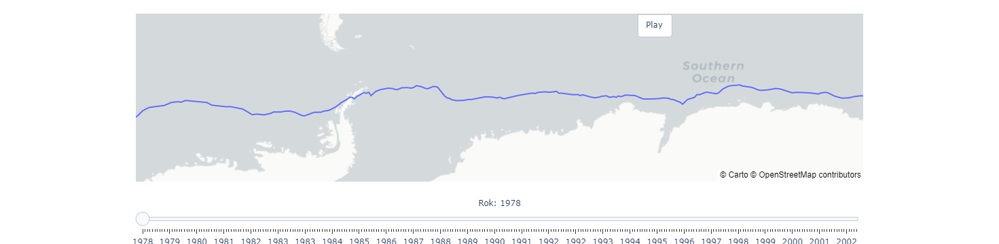

In [4]:
lons1 = list(df2) 
headers1 = lons1 
df2.columns = headers1 
lats1 = df2.loc[0].tolist() 
fig1 = go.Figure(go.Scattermapbox( mode = "lines", 
                                  lon = lons1, 
                                  lat = lats1,
                                  marker = {'size': 12})) 
fig1.update_layout( margin ={'l':200,'t':20,'b':0,'r':200}, 
                   mapbox = { 'style': "carto-positron", 'center': {'lon': 0, 'lat': -65}, 'zoom': 1.3}) 
frames1 = [go.Frame(data= [go.Scattermapbox( lat=df2.loc[k].values.tolist(), 
                                                               lon=lons1)], 
                                                               traces= [0], name=f'frame{k}'
                                                                )for k in range(0, 8701,15)]
fig1.update(frames=frames1); 
sliders1 = [dict(steps= [dict(method= 'animate', 
                              args= [[ f'frame{k}'], 
                                     dict(mode= 'immediate', 
                                          frame= dict(duration=150, redraw= True ), 
                                          transition=dict( duration= 0)) ], 
                                          label='{:.0f}'.format(k/365+1978.0) ) 
                                             for k in range(0,8701,30)], 
                 transition= dict(duration= 0 ), x=0,
y=0, 
                 currentvalue=dict(font=dict(size=12), 
                                   prefix='Rok: ', 
                                   visible=True, 
                                   xanchor= 'center'), 
                 len=1.0) ] 
fig1.update_layout(updatemenus=[dict(type='buttons', 
                                     showactive=False, y=1, 
                                     x=0.75, xanchor='right', 
                                     yanchor='top', pad=dict(t=0, r=15), 
                                     buttons=[dict(label='Play', 
                                                   method='animate', 
                                                   args=[None, dict(frame=dict(duration=150, redraw=True), 
                                                                    transition=dict(duration=0), 
                                                                    fromcurrent=True, mode='immediate' ) ] ) ] ) ], 
                   sliders=sliders1); 
fig1.show()

0     -65.531982
1     -65.531982
2     -65.531982
3     -65.531982
4     -65.531982
         ...    
356   -65.531982
357   -65.531982
358   -65.531982
359   -65.531982
360   -65.531982
Length: 361, dtype: float64


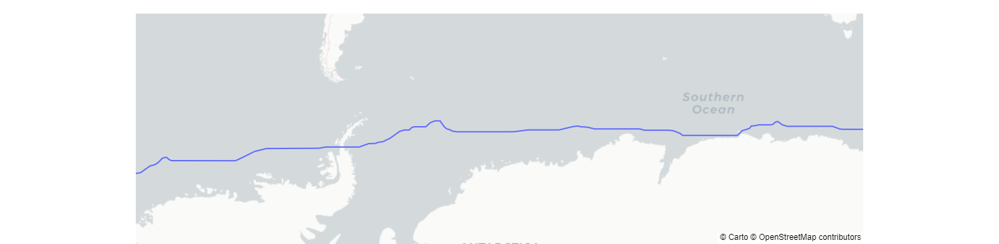

In [5]:
min_ice_extent2 = df2.min()
lon_min2 = list(min_ice_extent2.index)
lat_min2 = min_ice_extent2.values
print(min_ice_extent2)
fig = go.Figure(go.Scattermapbox(
    mode="lines",
    lon=lon_min2,
    lat=lat_min2,
    marker={'size': 12}
))

fig.update_layout(
    margin={'l': 200, 't': 20, 'b': 0, 'r': 200},
    mapbox={
        'style': "carto-positron",
        'center': {'lon': 0, 'lat': -65},
        'zoom': 1.3
    }
)